In [39]:
import os
os.environ['PROJ_LIB'] = r'C:\Users\Amber Camilleri\.conda\envs\ipykernel_py2\Library\share'

from pandas import Series, DataFrame
import pandas as pd
#%pylab inline
#import basemap-data-hires
from mpl_toolkits.basemap import Basemap
from matplotlib import pyplot as plt

# Incidents by Country (2017)

In [40]:
# Make a DataFrame with Number of Attacks per Country in 2017
data = pd.read_csv('global_terrorism_db.csv')

d = data[data['iyear']==2017].groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()
#print d

d2 = pd.DataFrame(data[data['iyear']==2017].groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)
# print d2

merged=d.merge(d2, on = 'country_txt')

print merged.head()

   country_txt   latitude  longitude                  region_txt  count
0  Afghanistan  34.297215  67.417528                  South Asia   1414
1      Albania  42.069084  19.503374              Eastern Europe      1
2      Algeria  36.087012   4.069603  Middle East & North Africa     14
3       Angola  -6.106705  13.860221          Sub-Saharan Africa      6
4    Argentina -41.700229 -71.224547               South America      3


In [41]:
# prepare a color for each point depending on the continent.
# data['labels_enc'] = pd.factorize(data['homecontinent'])[0]
# unique_regions = data.drop_duplicates(subset='region_txt')

merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

print merged.head()

#labels_enc= pd.factorize(unique_regions['region_txt'])[0]
# print data['labels_enc'].head()

   country_txt   latitude  longitude                  region_txt  count  \
0  Afghanistan  34.297215  67.417528                  South Asia   1414   
1      Albania  42.069084  19.503374              Eastern Europe      1   
2      Algeria  36.087012   4.069603  Middle East & North Africa     14   
3       Angola  -6.106705  13.860221          Sub-Saharan Africa      6   
4    Argentina -41.700229 -71.224547               South America      3   

   labels_enc  
0           0  
1           1  
2           2  
3           3  
4           4  


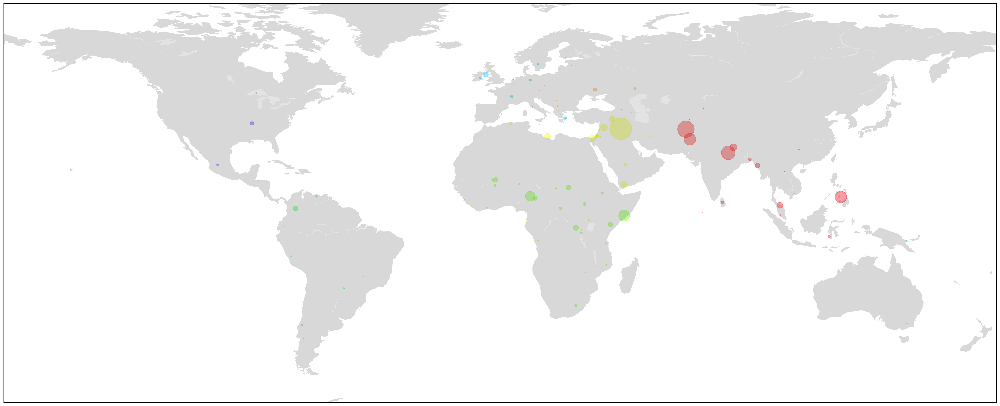

In [42]:
# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
#plt.figure(figsize=(600,400))
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'], 
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")

In [12]:
# Save as png
plt.savefig('GTD_Bubble_map2.png', bbox_inches='tight')

<Figure size 432x288 with 0 Axes>

# Incidents by Country (1970-2017)

In [12]:
# Make a DataFrame with Number of Attacks per Country from 1970 to 2017
data = pd.read_csv('global_terrorism_db.csv')

d = data.groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()
#print d

d2 = pd.DataFrame(data.groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)
# print d2

merged=d.merge(d2, on = 'country_txt')

print merged.head()

   country_txt   latitude  longitude                  region_txt  count
0  Afghanistan  33.878726  67.191111                  South Asia  12731
1      Albania  41.077462  19.838797              Eastern Europe     80
2      Algeria  36.223004   3.397750  Middle East & North Africa   2743
3      Andorra        NaN        NaN              Western Europe      1
4       Angola -10.069548  14.954111          Sub-Saharan Africa    499


In [17]:
# prepare a color for each point depending on the continent.
merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

print merged.head()

   country_txt   latitude  longitude                  region_txt  count  \
0  Afghanistan  33.878726  67.191111                  South Asia  12731   
1      Albania  41.077462  19.838797              Eastern Europe     80   
2      Algeria  36.223004   3.397750  Middle East & North Africa   2743   
3      Andorra        NaN        NaN              Western Europe      1   
4       Angola -10.069548  14.954111          Sub-Saharan Africa    499   

   labels_enc  
0           0  
1           1  
2           2  
3           3  
4           4  


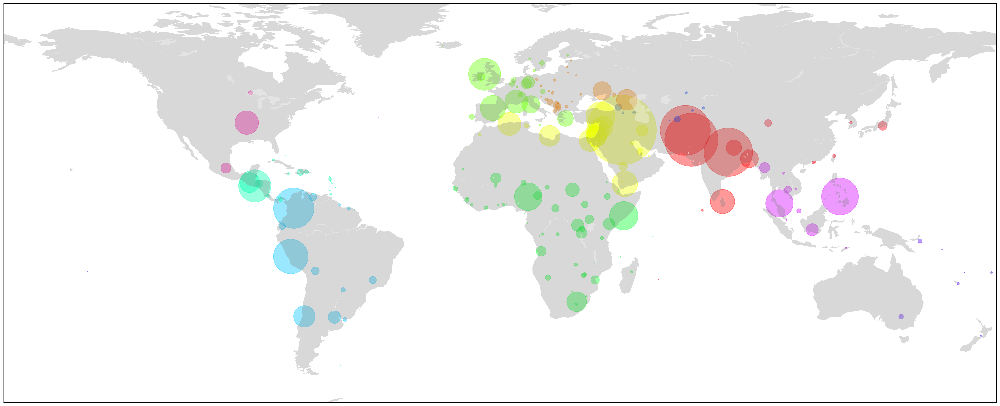

In [35]:
# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'],
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")

In [34]:
print merged[['region_txt','labels_enc']].drop_duplicates()

                     region_txt  labels_enc
0                    South Asia           0
1                Eastern Europe           1
2    Middle East & North Africa           2
3                Western Europe           3
4            Sub-Saharan Africa           4
5   Central America & Caribbean           5
6                 South America           6
7                  Central Asia           7
8         Australasia & Oceania           8
24               Southeast Asia           9
30                North America          10
34                    East Asia          11


# Incidents by Country (1970-1979)

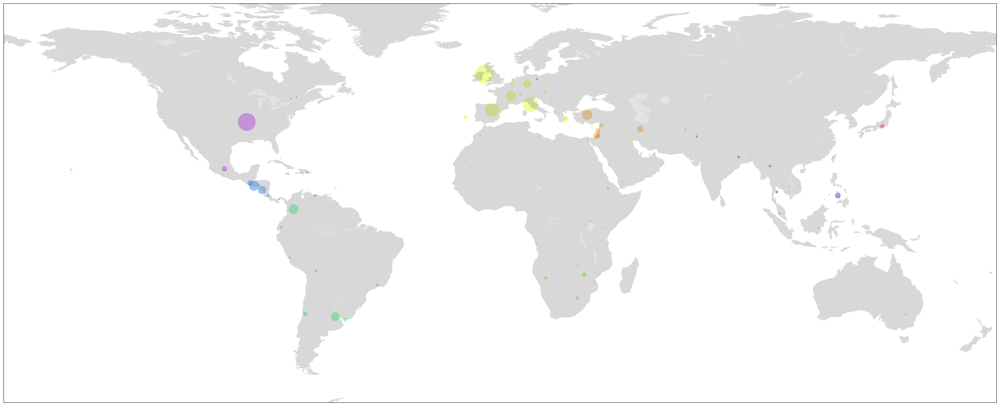

In [43]:
# Make a DataFrame with Number of Attacks per Country
data = pd.read_csv('global_terrorism_db.csv')

d = data[data['iyear']<=1979].groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()

d2 = pd.DataFrame(data[data['iyear']<=1979].groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)

merged=d.merge(d2, on = 'country_txt')

# prepare a color for each point depending on the Region.
merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'],
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")

# Incidents by Country (1980-1989)

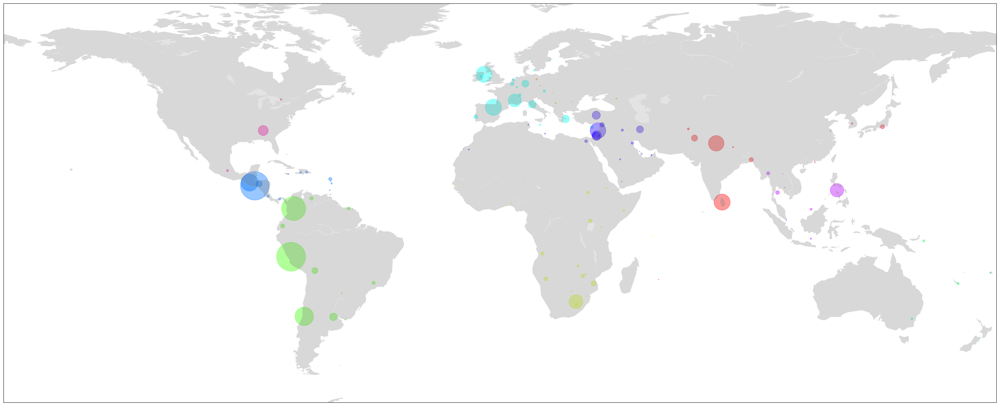

In [55]:
# Make a DataFrame with Number of Attacks per Country
data = pd.read_csv('global_terrorism_db.csv')

d = data[(data['iyear']>1979) & (data['iyear']<=1989)].groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()

d2 = pd.DataFrame(data[(data['iyear']>1979) & (data['iyear']<=1989)].groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)

merged=d.merge(d2, on = 'country_txt')

# prepare a color for each point depending on the Region.
merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'],
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")

# Incidents by Country (1990-1999)

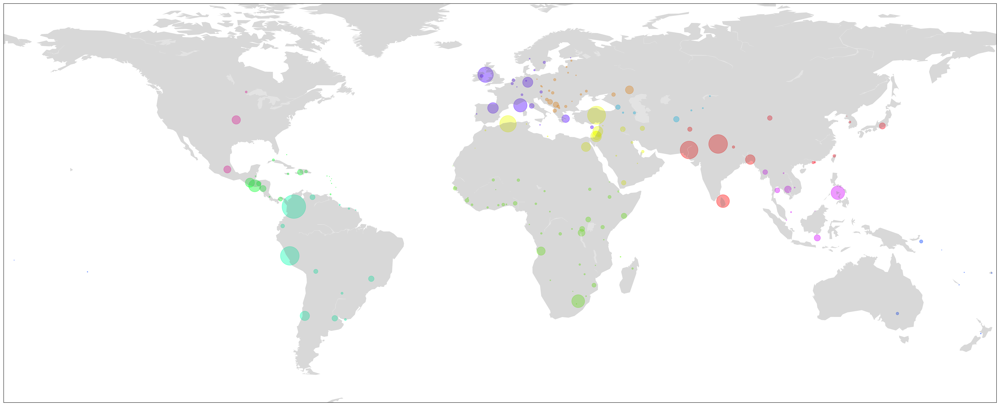

In [56]:
# Make a DataFrame with Number of Attacks per Country
data = pd.read_csv('global_terrorism_db.csv')

d = data[(data['iyear']>1989) & (data['iyear']<=1999)].groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()

d2 = pd.DataFrame(data[(data['iyear']>1989) & (data['iyear']<=1999)].groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)

merged=d.merge(d2, on = 'country_txt')

# prepare a color for each point depending on the Region.
merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'],
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")

# Incidents by Country (2000-2009)

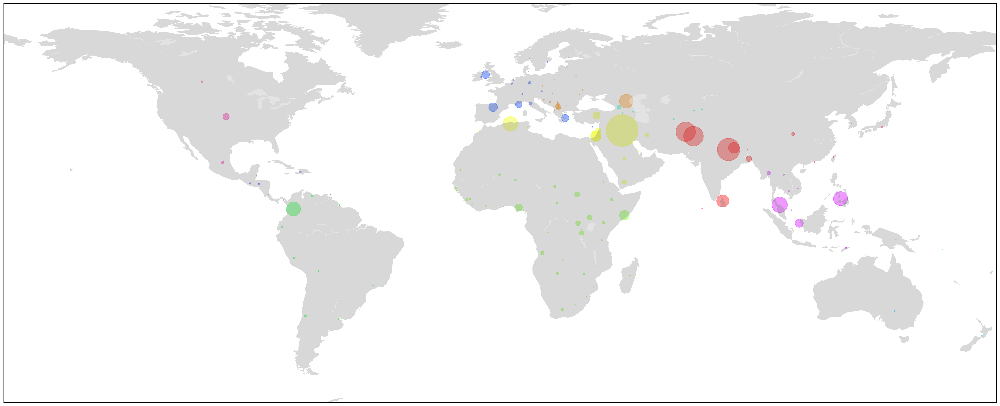

In [57]:
# Make a DataFrame with Number of Attacks per Country
data = pd.read_csv('global_terrorism_db.csv')

d = data[(data['iyear']>1999) & (data['iyear']<=2009)].groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()

d2 = pd.DataFrame(data[(data['iyear']>1999) & (data['iyear']<=2009)].groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)

merged=d.merge(d2, on = 'country_txt')

# prepare a color for each point depending on the Region.
merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'],
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")

# Incidents by Country (2010-2017)

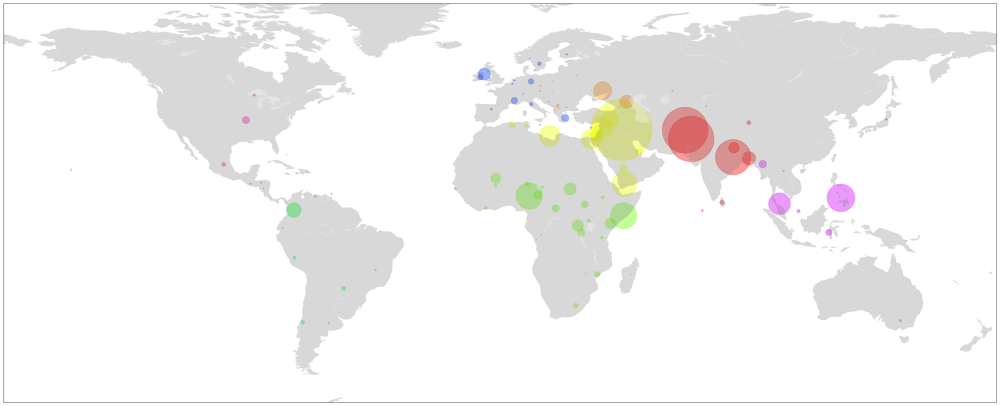

In [58]:
# Make a DataFrame with Number of Attacks per Country
data = pd.read_csv('global_terrorism_db.csv')

d = data[(data['iyear']>2009) & (data['iyear']<=2018)].groupby(["country_txt"], as_index=False)[["latitude","longitude"]].mean()

d2 = pd.DataFrame(data[(data['iyear']>2009) & (data['iyear']<=2018)].groupby(['region_txt','country_txt'])['country_txt'].count())
d2.columns = ['count']
d2.reset_index(inplace=True)

merged=d.merge(d2, on = 'country_txt')

# prepare a color for each point depending on the Region.
merged['labels_enc'] = pd.factorize(merged['region_txt'])[0]

# Set the dimension of the figure
my_dpi=300
plt.figure(figsize=(12000/my_dpi, 10000/my_dpi), dpi=my_dpi)

# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")

# Add a point per position
m.scatter(merged['longitude'],
          merged['latitude'], 
          s=merged['count'], 
          alpha=0.4,
          c=merged['labels_enc'],
          cmap="hsv")